In [39]:
import torch
from torch import nn
from torchvision import models
from models import Encoder, Decoder
import pandas as pd
from nltk.tokenize import word_tokenize
from string import punctuation
from torchtext.vocab import build_vocab_from_iterator
import torchtext; torchtext.disable_torchtext_deprecation_warning()
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt
from torchvision import transforms
from PIL import Image
device = 'cuda' if torch.cuda.is_available() else 'cpu'

In [11]:
data = pd.read_csv("./flickr8k/captions.txt")

In [12]:
def clean_text(text, lowercase=False, remove_punc=False, remove_num=False, sos_token='<sos>', eos_token='<eos>'):
    if lowercase:
        text = text.lower()
    if remove_punc:
        text = ''.join([ch for ch in text if ch not in punctuation])
    if remove_num:
        text = ''.join([ch for ch in text if ch not in '1234567890'])
    text = [sos_token] + word_tokenize(text) + [eos_token]
    return text

In [15]:
unk_token = '<unk>'
pad_token = '<pad>'
sos_token = '<sos>'
eos_token = '<eos>'

In [16]:
clean_cap = data['caption'].apply(lambda x: clean_text(x, lowercase=True, remove_punc=True, remove_num=True))

In [17]:
data['clean_caption'] = clean_cap

In [21]:
vocab = build_vocab_from_iterator(clean_cap, specials=[unk_token, pad_token, sos_token, eos_token])

In [22]:
pad_token_idx = vocab[pad_token]
unk_token_idx = vocab[unk_token]

In [23]:
vocab.set_default_index(unk_token_idx)

In [24]:
# to number
def text_to_number(text, vocab):
    return [vocab[token] for token in text]

In [25]:
to_int = clean_cap.apply(lambda x: text_to_number(x, vocab))

In [26]:
data['embed_caption'] = to_int

In [27]:
data.head()

,image,caption,clean_caption,embed_caption
0,1000268201_693b08cb0e.jpg,A child in a pink dress is climbing up a set o...,"[<sos>, a, child, in, a, pink, dress, is, clim...","[2, 4, 43, 5, 4, 91, 171, 8, 120, 54, 4, 400, ..."
1,1000268201_693b08cb0e.jpg,A girl going into a wooden building .,"[<sos>, a, girl, going, into, a, wooden, build...","[2, 4, 20, 316, 65, 4, 196, 118, 3]"
2,1000268201_693b08cb0e.jpg,A little girl climbing into a wooden playhouse .,"[<sos>, a, little, girl, climbing, into, a, wo...","[2, 4, 41, 20, 120, 65, 4, 196, 2569, 3]"
3,1000268201_693b08cb0e.jpg,A little girl climbing the stairs to her playh...,"[<sos>, a, little, girl, climbing, the, stairs...","[2, 4, 41, 20, 120, 6, 394, 21, 61, 2569, 3]"
4,1000268201_693b08cb0e.jpg,A little girl in a pink dress going into a woo...,"[<sos>, a, little, girl, in, a, pink, dress, g...","[2, 4, 41, 20, 5, 4, 91, 171, 316, 65, 4, 196,..."


In [29]:
train, test = train_test_split(data, test_size=0.2, random_state=42)
train = train.reset_index(drop=True)
test = test.reset_index(drop=True)

In [79]:
def predict_caption(model, image, vocab, max_length=20):
    model.eval()
    with torch.no_grad():
        features = model.encoder(image).unsqueeze(1)
        input = features
        hidden = torch.zeros(model.num_layers, 1, model.lstm.hidden_size).to(model.device)
        cell = torch.zeros(model.num_layers, 1, model.lstm.hidden_size).to(model.device)

        caption = []
        for _ in range(max_length):
            output, (hidden, cell) = model.lstm(input, (hidden, cell))
            output = model.linear(output.squeeze(1))
            predicted = output.argmax(1)
            caption.append(predicted.item())
            input = model.dropout(model.embed(predicted)).unsqueeze(1)
            if predicted.item() == vocab['<eos>']:
                break
    pred = vocab.lookup_tokens(caption)      
    return ' '.join(pred[1:-1])

In [80]:
embed_dim = 256
hidden_dim = 512
vocab_size = len(vocab)
num_layers = 2
dropout = 0.5

In [81]:
transform = transforms.Compose([
    # data type convert to tensor
    transforms.Resize((256, 256)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.5, 0.5, 0.5], std=[0.5, 0.5, 0.5])
    
])

In [82]:
encoder = Encoder(embed_dim, dropout)
best_model = Decoder(embed_dim, hidden_dim, vocab_size, num_layers, device, encoder, dropout )

In [83]:
best_model.load_state_dict(torch.load('last_model.pt', map_location=torch.device('cpu')))

<All keys matched successfully>

In [84]:
data = train.head(25)[['image', 'caption']].values

Real Caption: A man and a dog are standing on a tree that has fallen over to the ground .
Predicted Caption: a dog is running through a field of grass and dandilions


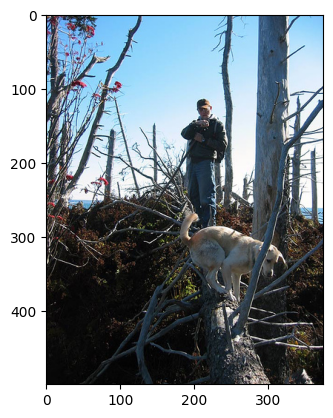




Real Caption: The three boys who are wearing life jackets are looking into the water .
Predicted Caption: a group of people are sitting in a canoe on a river


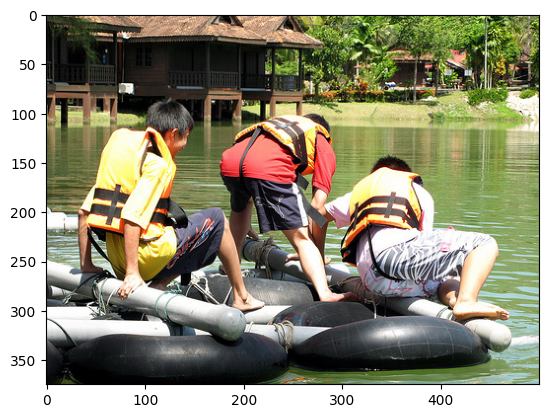




Real Caption: A woman with a camera with a very long lens takes a picture .
Predicted Caption: a man in a black shirt is standing in front of a building


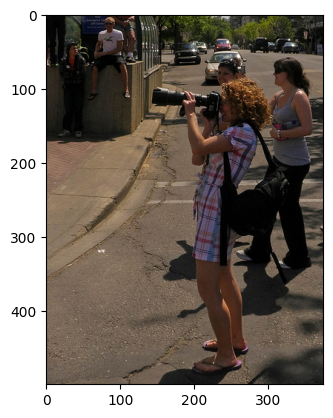




Real Caption: Woman with red crash helmet and Native American tattoo on her arm .
Predicted Caption: a woman in a blue shirt is standing next to a florescent man in a black shirt


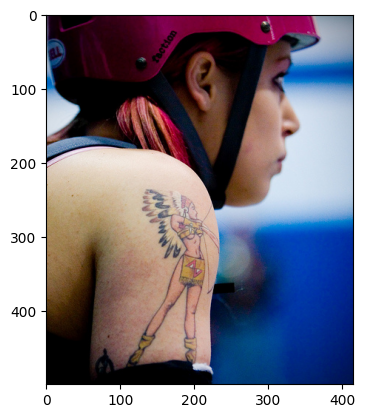




Real Caption: One person is whispering to another .
Predicted Caption: a young girl with a blue shirt is smiling


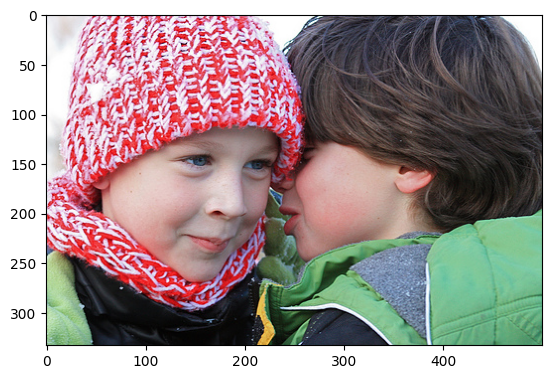




Real Caption: Two large dogs are fighting with teeth bared near some trees .
Predicted Caption: a brown dog is running through a grassy field


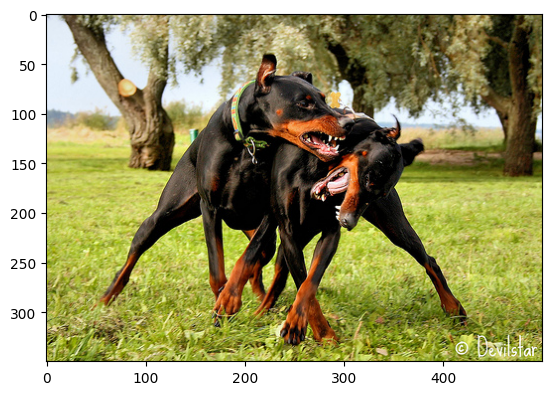




Real Caption: A dog swims in the lake .
Predicted Caption: a dog is running through the water


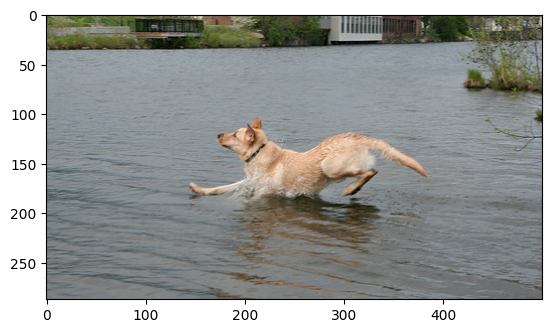




Real Caption: A wet dog walks out of the water .
Predicted Caption: a brown dog is running through the water


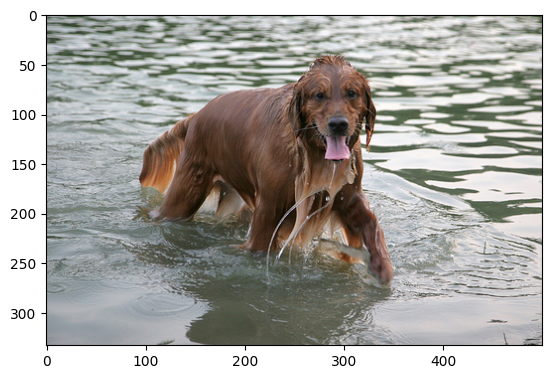




Real Caption: A woman in an orange dress riding a carnival ride .
Predicted Caption: a man in a red shirt is standing in front of a reception desk


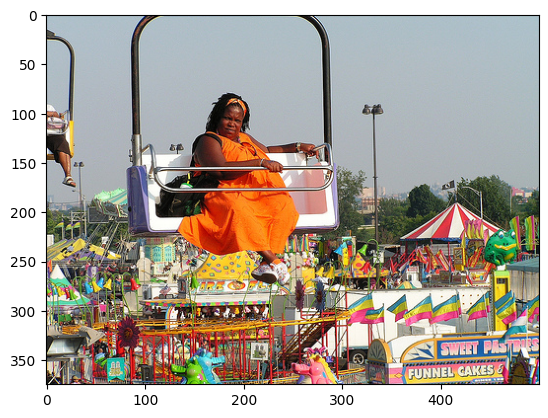




Real Caption: A black dog carries a huge stick in its mouth .
Predicted Caption: a black dog is running through the snow


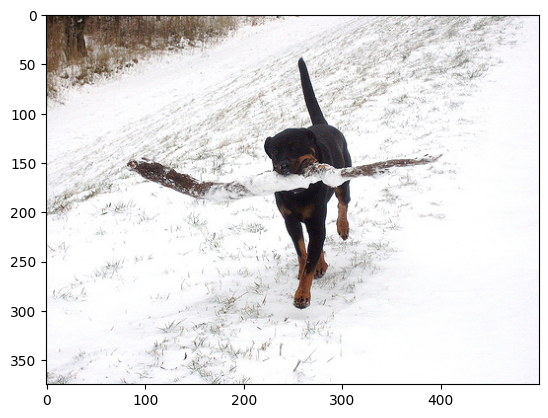




Real Caption: A girl in white is swinging a sword .
Predicted Caption: a man is standing in front of a reception desk


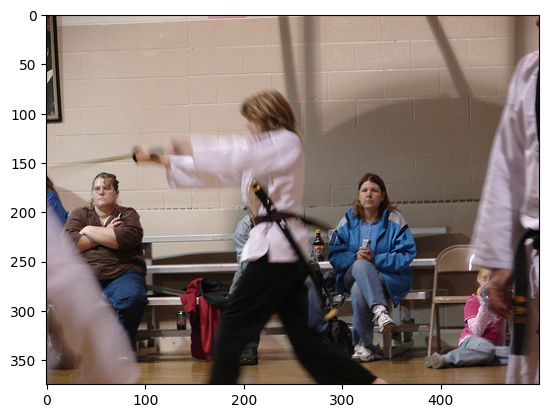




Real Caption: A shirtless dark haired boy in gray shorts is running .
Predicted Caption: a little girl in a pink shirt is running through a grassy area


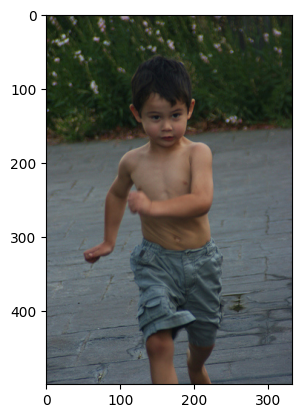




Real Caption: A group of
Predicted Caption: a girl in a red dress is standing in front of a group of people


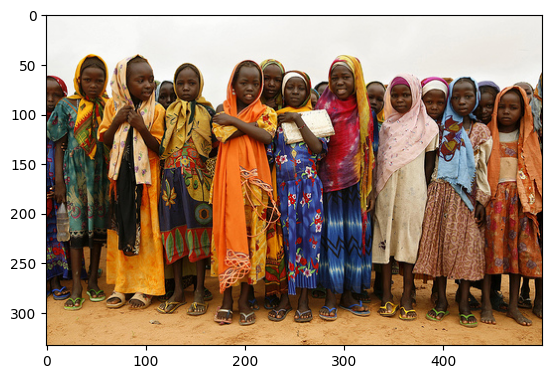




Real Caption: Two women with strollers standing next to a table and chair .
Predicted Caption: a man in a white shirt is standing in a doorway


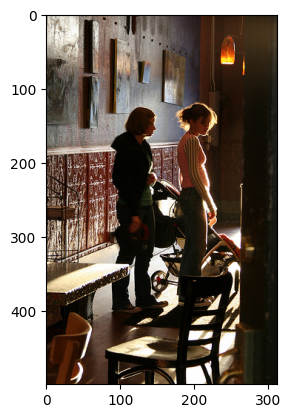




Real Caption: The laughing boy holds a water bottle while a lady with wet pants walks nearby .
Predicted Caption: a man in a white shirt and jeans is standing in a doorway


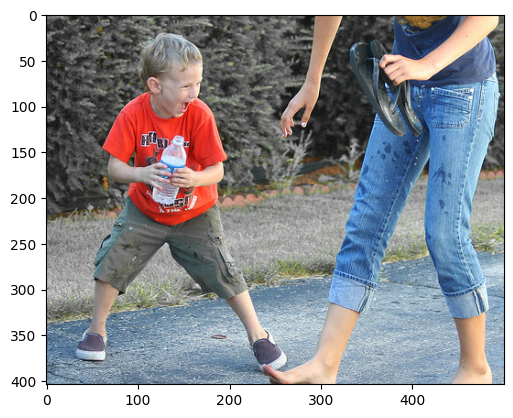




Real Caption: A man bowls with a red bowling ball .
Predicted Caption: a man is standing in front of a reception desk


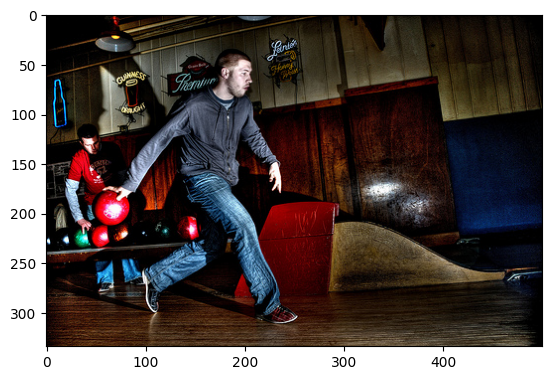




Real Caption: Two dogs run in a field of brown grass .
Predicted Caption: a dog is running through the snow


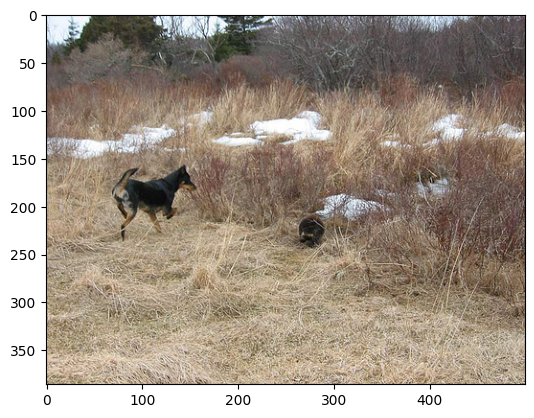




Real Caption: Two women playing field hockey .
Predicted Caption: a man in a white shirt is winning a basketball in a professional game


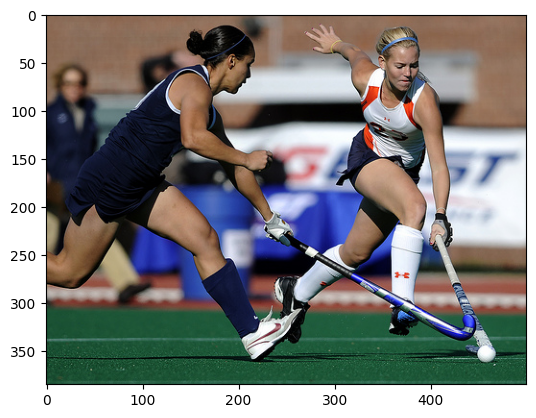




Real Caption: A black and white dog with a blue halter runs through the grass .
Predicted Caption: a black and white dog is running through a grassy field


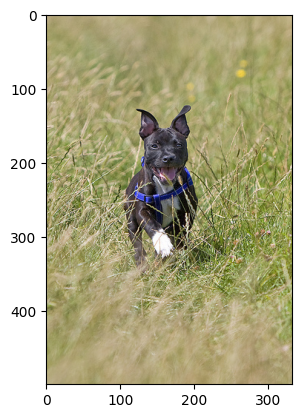




Real Caption: Riding a sled down a hill .
Predicted Caption: a snowboarder in a red jacket is riding a red sled


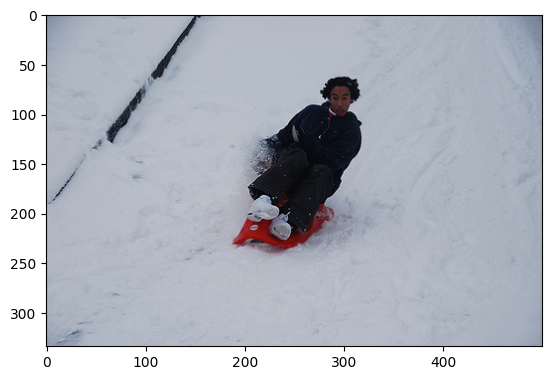




Real Caption: A black dog plays with a white and blue colored stuffed animal .
Predicted Caption: a black dog is running with a ball in its mouth


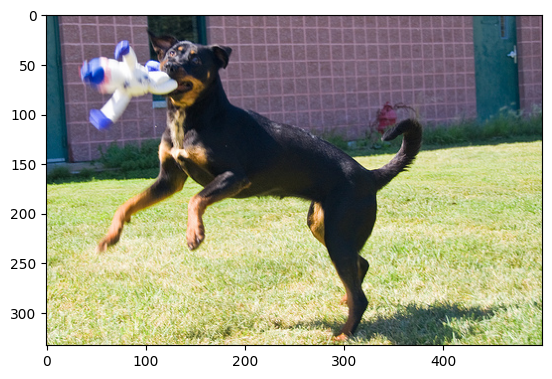




Real Caption: A woman paddles a boat down a river .
Predicted Caption: a man is paddling a kayak through water


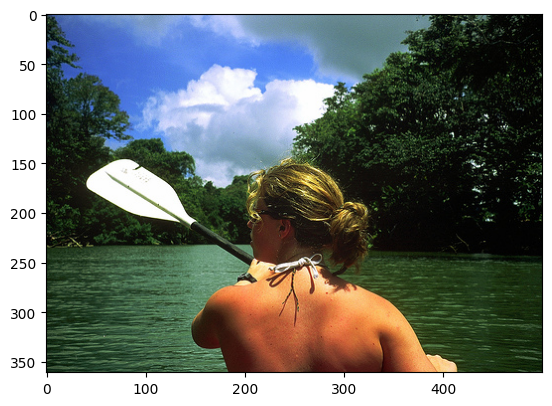




Real Caption: A swimmer doing the breaststroke in a pool .
Predicted Caption: a young boy wearing a blue shirt is playing in the water


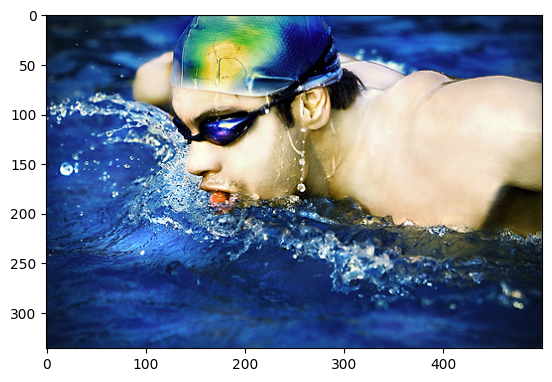




Real Caption: Two wet dogs run into the surf at sunset .
Predicted Caption: a black dog is running gover the beach


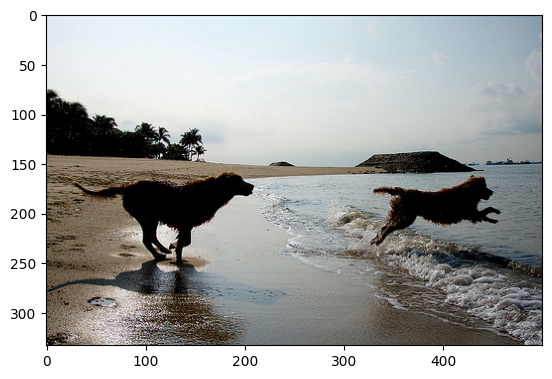




Real Caption: A man in a red shirt is giving toys to a small dog .
Predicted Caption: a dog is jumping up at a woman in a blue shirt


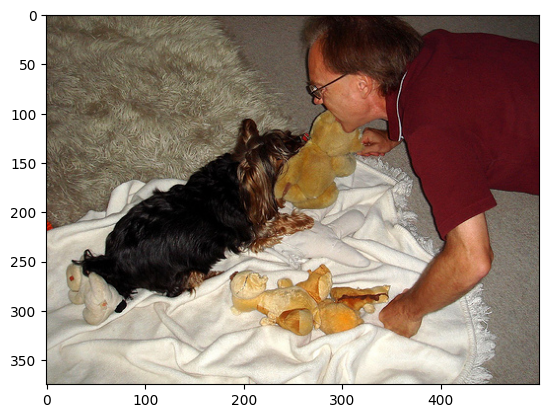

In [85]:
# show image and real caption, and predicted caption
for i in range(25):
    image = Image.open(f"./flickr8k/Images/{data[i][0]}")
    plt.imshow(image)
    
    image = transform(image).unsqueeze(0).to(device)
    pred = predict_caption(best_model, image, vocab)
    print(f"Real Caption: {data[i][1]}")
    print(f"Predicted Caption: {pred}")
    
    plt.show()
    print("\n\n")